In [135]:
from typing import List
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import os
import pyro
import pyro.distributions as dist
import pyro.optim as optim
import seaborn as sns
import torch
from pyro.infer import SVI, Predictive, Trace_ELBO
from pyro.infer.autoguide import AutoMultivariateNormal, init_to_mean
import plotly.express as px
import collab.foraging.toolkit as ft

from collab.utils import find_repo_root
root = find_repo_root()
import logging
import time

logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(message)s")
derivation_logger = logging.getLogger(__name__)

# Hyperparameters for each fish age

In [136]:
exp_names = ["2wpf_091522_3", "4wpf_060222_5", "6wpf_091522_2", "8wpf_070122_1"]
arena_size = [150,300,300,300] #in mm

# params for discretization 
frame_spacing = [120,40,40,20]
grid_size = [150,150,150,150]

# local windows
window_size = 5 #grid units
sampling_fraction = 0.6

# grid constraint
def circular_constraint_func(grid, c_x, c_y, R):
    ind = ((grid["x"] - c_x) ** 2 + (grid["y"] - c_y) ** 2) < R**2
    return grid.loc[ind]

# interaction length (same for all predictors)
L = 50 # units : mm. Note that numerical value may differ for each age after unit conversion

# velocity predictors
sigma_v = 4 # units : mm/frame_spacing, i.e. we only need to convert length units. Numerical value may be different for each age after unit conversion!
sigma_t = 1 # units : rds. Same for all ages

# proximity predictor parameters. These are different for each age as they scale with bodylength!
# need to convert these values from mm to grid units!
repulsion_radius = [4, 7, 10, 12] #mm
optimal_proximity = [6, 10.5, 15, 18] #mm
proximity_decay = 0.1 #(mm)^-1

# score_kwargs
decay_length = 2 #grid units

# Generate predictors

In [137]:
def get_derivedDF(exp : str, exp_index : int):
    print("-"*50)
    print(f"Computing derivedDF for experiment: {exp}")
    print("-"*50)
    start = time.time()
    raw_data = pd.read_csv(
        os.path.join(
            root,
            f"data/foraging/fish/{exp}.csv",
        )
    )

    # generate data object after subsampling
    processed_data = ft.rescale_to_grid(ft.subsample_frames_constant_frame_rate(raw_data, frame_spacing=frame_spacing[exp_index]), gridMax=arena_size[exp_index], size=grid_size[exp_index])
    object = ft.dataObject(foragersDF=processed_data, grid_size=grid_size[exp_index])

    # create dictionaries for predictor/score kwargs by changing to appropriate units
    length_conversion = grid_size[exp_index]/arena_size[exp_index] #grid_units / mm

    grid_constraint_params = {
        "c_x": grid_size[exp_index]/ 2,
        "c_y": grid_size[exp_index]/ 2,
        "R": grid_size[exp_index]/ 2,
    }

    predictor_kwargs = {
        "proximity": {
            "interaction_length": L * length_conversion,
            "optimal_distance": optimal_proximity[exp_index] * length_conversion,
            "repulsion_radius": repulsion_radius[exp_index] * length_conversion,
            "proximity_decay": proximity_decay / length_conversion,
        },

        "vicsek": {
            "interaction_length" : L* length_conversion,
            "sigma_v" : sigma_v * length_conversion,
            "sigma_t" : sigma_t,
            "dt" : 1
        },

        "velocityDiffusion": {
            "sigma_v" : sigma_v * length_conversion,
            "sigma_t" : sigma_t,
            "dt" : 1
        }
    }

    local_windows_kwargs = {
        "window_size": window_size,
        "sampling_fraction": sampling_fraction,
        "skip_incomplete_frames": True,
        "grid_constraint" : circular_constraint_func,
        "grid_constraint_params" : grid_constraint_params

    }

    score_kwargs = {
        "nextStepExponential": {
                "decay_length" : decay_length
            }
    }

    derivedDF = ft.derive_predictors_and_scores(
        object,
        local_windows_kwargs,
        predictor_kwargs=predictor_kwargs,
        score_kwargs=score_kwargs,
        dropna=True,
        add_scaled_values=True
        )
    end = time.time()
    print("\n\n")
    derivation_logger.info(f"Experiment {exp} completed in {end-start:.2f} seconds.")
    return derivedDF

In [138]:
exp_wise_derivedDF = {}

for i,exp in enumerate(exp_names):
    derivedDF = get_derivedDF(exp_index=i, exp=exp)

    exp_wise_derivedDF[exp] = derivedDF

--------------------------------------------------
Computing derivedDF for experiment: 2wpf_091522_3
--------------------------------------------------
original_frames: 36107
original_shape: (144428, 4)
resulting_frames: 301
resulting_shape: (1204, 4)


/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/utils.py:42: UserWarning:


                NaN values in data. The default behavior of predictor/score generating functions is
                to ignore foragers with missing positional data. To modify, see documentation of
                `derive_predictors_and_scores` and `generate_local_windows`
                

2024-12-18 07:26:51,536 - Local windows completed in 13.04 seconds.
2024-12-18 07:27:00,723 - proximity completed in 9.18 seconds.
2024-12-18 07:27:14,308 - vicsek completed in 13.58 seconds.
2024-12-18 07:27:22,618 - velocityDiffusion completed in 8.31 seconds.
2024-12-18 07:27:24,984 - nextStepExponential completed in 2.37 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 3762/51731 (~7.27%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depend




--------------------------------------------------
Computing derivedDF for experiment: 4wpf_060222_5
--------------------------------------------------
original_frames: 18739
original_shape: (74956, 4)
resulting_frames: 469
resulting_shape: (1876, 4)


2024-12-18 07:27:39,362 - Local windows completed in 13.51 seconds.
2024-12-18 07:27:53,798 - proximity completed in 14.44 seconds.
2024-12-18 07:28:13,083 - vicsek completed in 19.28 seconds.
2024-12-18 07:28:25,665 - velocityDiffusion completed in 12.58 seconds.
2024-12-18 07:28:30,523 - nextStepExponential completed in 4.86 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 438/101034 (~0.43%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depend on next/previous positions
                      that are unavailable. See documentation of the corresponding predictor/score generating functions
                      for more information.
                      

2024-12-18 07:28:31,230 - derivedDF generated in 0.71 seconds.
2024-12-18 07:28:31,231 - Experiment 4wpf_060222_5 completed in 65.44 seconds.





--------------------------------------------------
Computing derivedDF for experiment: 6wpf_091522_2
--------------------------------------------------
original_frames: 36779
original_shape: (147116, 4)
resulting_frames: 920
resulting_shape: (3680, 4)


2024-12-18 07:28:58,988 - Local windows completed in 27.55 seconds.
2024-12-18 07:29:31,800 - proximity completed in 32.81 seconds.
2024-12-18 07:30:13,982 - vicsek completed in 42.18 seconds.
2024-12-18 07:30:41,035 - velocityDiffusion completed in 27.05 seconds.
2024-12-18 07:30:48,633 - nextStepExponential completed in 7.60 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 391/196840 (~0.20%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depend on next/previous positions
                      that are unavailable. See documentation of the corresponding predictor/score generating functions
                      for more information.
                      

2024-12-18 07:30:50,680 - derivedDF generated in 2.05 seconds.
2024-12-18 07:30:50,681 - Experiment 6wpf_091522_2 completed in 139.36 seconds.





--------------------------------------------------
Computing derivedDF for experiment: 8wpf_070122_1
--------------------------------------------------
original_frames: 37226
original_shape: (148904, 4)
resulting_frames: 1862
resulting_shape: (7448, 4)


/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/utils.py:42: UserWarning:


                NaN values in data. The default behavior of predictor/score generating functions is
                to ignore foragers with missing positional data. To modify, see documentation of
                `derive_predictors_and_scores` and `generate_local_windows`
                

2024-12-18 07:31:38,064 - Local windows completed in 47.09 seconds.
2024-12-18 07:32:41,752 - proximity completed in 63.69 seconds.
2024-12-18 07:34:10,238 - vicsek completed in 88.48 seconds.
2024-12-18 07:35:00,357 - velocityDiffusion completed in 50.12 seconds.
2024-12-18 07:35:15,786 - nextStepExponential completed in 15.43 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 1357/401974 (~0.34%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations de

# Model

In [139]:
class FishModel(pyro.nn.PyroModule):
    def __init__(self, predictors: dict, score: dict):
        super().__init__()

        self.predictors = predictors
        self.score = score
        self.n = len(score)

    def forward(self, predictors=None, score=None):
        if predictors is None:
            predictors = self.predictors

        size = len(next(iter(predictors.values())))

        weights = {}
        sigmas = {}
        for key in predictors.keys():
            weights[key] = pyro.sample(f"weight_{key}", dist.Normal(0.0, 1))
            sigmas[key] = pyro.sample(f"sigma_{key}", dist.Exponential(10.0))

        weights["b"] = pyro.sample("b", dist.Normal(0.5, 0.3))
        sigmas["bs"] = pyro.sample("bs", dist.Exponential(10.0))

        with pyro.plate("data", size):
            sigma = pyro.deterministic(
                "sigma",
                sum([predictors[key] * sigmas[key] for key in predictors.keys()])
                + sigmas["bs"],
            )

            sigma = torch.nn.functional.softplus(sigma) #since proximity predictor can be negative!

            assert torch.all(sigma > 0), "Sigma is not positive"

            mean = pyro.deterministic(
                "mean",
                sum([predictors[key] * weights[key] for key in predictors.keys()])
                + weights["b"],
            )

            observed_score = None
            if score is not None:
                observed_score = next(iter(score.values())) # gets the values without knowing the key ie score name

            pyro.sample("predicted_score", dist.Normal(mean, sigma), obs=observed_score)

# Helper functions for inference, model evaluation and visualization

In [140]:
def get_tensors_for_inference(
    derivedDF: pd.DataFrame, predictor_names: List[str], score_names: List[str]
):
    predictors = {}
    for name in predictor_names:
        predictors[name] = torch.tensor(derivedDF[name].values)

    scores = {}
    for name in score_names:
        scores[name] = torch.tensor(derivedDF[name].values)

    return predictors, scores

def run_svi_and_get_samples(
    model, predictors, score, num_svi_iters=600, verbose=False, num_samples=1000
):
    guide = AutoMultivariateNormal(model, init_loc_fn=init_to_mean)
    svi = SVI(model, guide, optim.Adam({"lr": 0.01}), loss=Trace_ELBO())

    iterations = []
    losses = []

    logging.info(f"Starting SVI inference with {num_svi_iters} iterations.")
    start_time = time.time()
    pyro.clear_param_store()
    for i in range(num_svi_iters):
        elbo = svi.step(predictors=predictors, score=score)
        iterations.append(i)
        losses.append(elbo)
        if i % 200 == 0:
            logging.info("Step {}, elbo loss: {}".format(i, elbo))
    end_time = time.time()
    elapsed_time = end_time - start_time
    logging.info("SVI inference completed in %.2f seconds.", elapsed_time)

    if verbose:
        fig = px.line(
            x=iterations, y=losses, title="ELBO loss", template="presentation"
        )
        labels = {"iterations": "iteration", "losses": "loss"}
        fig.update_xaxes(showgrid=False, title_text=labels["iterations"])
        fig.update_yaxes(showgrid=False, title_text=labels["losses"])
        fig.update_layout(width=700)
        fig.show()

    site_names = [f"weight_{key}" for key in predictors.keys()]
    predictive = Predictive(
        model=model,
        guide=guide,
        num_samples=num_samples,
        parallel=False,
        return_sites=site_names,
    )
    samples = predictive(predictors=predictors, score=score)
    return guide, samples

# getting score predictions is slower. only do that for a fraction of datapoints
# and fewer samples!
def evaluate_performance(
    model, guide, predictors, score, num_samples=100, sampling_fraction=1
):
    score_name = next(iter(score.keys()))

    sub_size = int(score[score_name].size(0) * sampling_fraction)
    randinds = torch.randint(0, score[score_name].size(0), (sub_size,))

    # downsample predictors and score
    score_sub = {score_name: score[score_name][randinds]}

    predictors_sub = {}
    for key, value in predictors.items():
        predictors_sub[key] = value[randinds]

    predictive = Predictive(
        model=model,
        guide=guide,
        num_samples=num_samples,
        parallel=False,
        return_sites=["predicted_score"],
    )
    samples = predictive(predictors=predictors_sub, score=None)

    predictions = samples["predicted_score"]

    predictions_mean = predictions.mean(dim=0)
    predictions_lower = predictions.quantile(0.025, dim=0)
    predictions_upper = predictions.quantile(0.975, dim=0)

    coverage = (
        (
            (predictions_lower <= score_sub[score_name])
            & (score_sub[score_name] <= predictions_upper)
        )
        .float()
        .mean()
    )

    observed_mean = score_sub[score_name].mean()

    residuals = score_sub[score_name] - predictions_mean

    mae = (torch.abs(residuals)).mean()

    rsquared = 1 - (
        torch.sum(residuals**2)
        / torch.sum((score_sub[score_name] - observed_mean) ** 2)
    )

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    heatmap = ax[0].hexbin(
        score_sub[score_name],
        predictions_mean,
        gridsize=100,
        cmap="Blues",
        norm=mpl.colors.LogNorm(),
    )
    fig.colorbar(heatmap, ax=ax[0])
    ax[0].set_title("Ratio of outcomes within 95% CI: {:.2f}".format(coverage.item()))
    ax[0].set_xlabel("observed values")
    ax[0].set_ylabel("mean predicted values")

    ax[1].hist(residuals.detach().numpy(), bins=50)
    ax[1].set_title(f"Residuals, MAE: {mae.item():.2f}, R²: {rsquared.item():.2f}")
    ax[1].set_xlabel("residuals")
    ax[1].set_ylabel("count")

    # print(f"Residuals, MAE: {mae.item():.2f}, R²: {rsquared.item():.2f}")

    plt.tight_layout(rect=(0, 0, 1, 0.96))
    sns.despine()
    fig.suptitle("Model evaluation", fontsize=16)
    plt.show()


def plot_density(predictors, scores, title):
    n_plots = len(predictors) * len(scores)
    #print(n_plots)
    ncols = 3
    nrows = np.ceil(n_plots / ncols).astype(int)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3 * nrows))

    plot_index = 0
    for i, predictor_name in enumerate(predictors.keys()):
        for j, score_name in enumerate(scores.keys()):

            if nrows > 1:
                r = plot_index // ncols
                c = plot_index % ncols
                #print([r,c])
                ax = axes[r, c]
            else:
                ax = axes[plot_index]

            heatmap = ax.hexbin(
                predictors[predictor_name],
                scores[score_name],
                gridsize=100,
                cmap="Blues",
                norm=mpl.colors.LogNorm(),
            )
            fig.colorbar(heatmap, ax=ax)
            ax.set_xlabel(f"{predictor_name} predictor")
            ax.set_ylabel(f"{score_name} score")
            # ax.set_aspect("equal")
            plot_index += 1

    # remove unused plots
    if n_plots % ncols:
        for ind in range(n_plots % ncols, ncols):
            if nrows > 1:
                fig.delaxes(axes[nrows-1,ind])
            else:
                fig.delaxes(axes[ind])

    fig.suptitle(title)
    fig.tight_layout()


def plot_distributions(derivedDF, column_names, title):
    fig, ax = plt.subplots(1, len(column_names), figsize=(3 * len(column_names), 3))

    for i, column in enumerate(column_names):
        ax[i].hist(derivedDF[column], bins=20, density=True, alpha=1)
        ax[i].set_yscale("log")
        ax[i].set_ylim([10**-3, 10**2])
        ax[i].set_xlabel(column)
        ax[i].set_ylabel("PDF")

    fig.suptitle(title)
    fig.tight_layout()

# Inference using raw predictors and scores

In [141]:
score_names = ["nextStepExponential"]
predictor_names = ["proximity", "vicsek", "velocityDiffusion"]

### Visualize the predictors and scores for each age

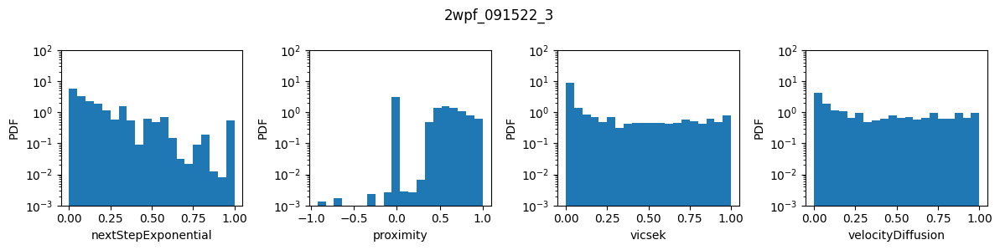

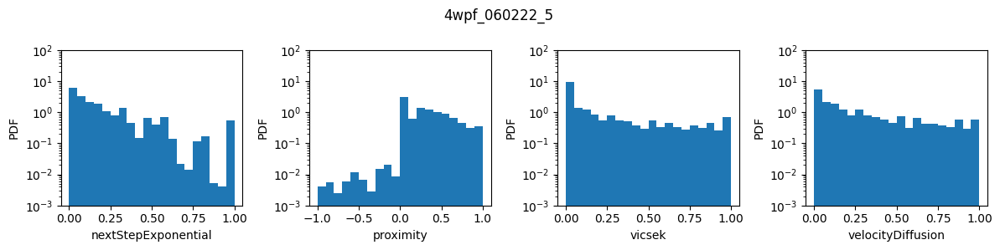

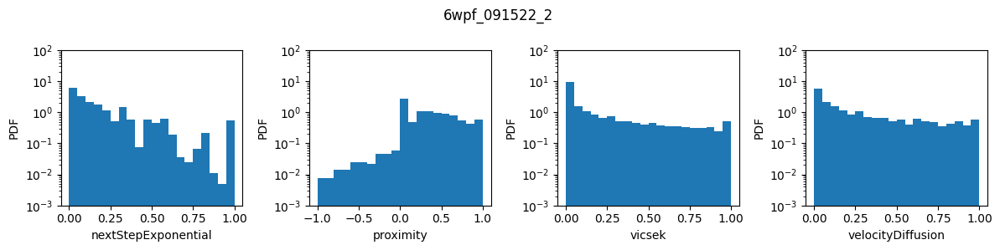

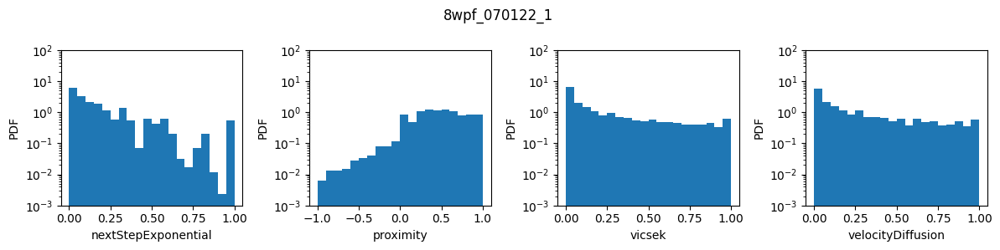

In [142]:
for exp in exp_names:
    plot_distributions(exp_wise_derivedDF[exp], score_names + predictor_names,title=exp)

### Perform inference and save coefficient samples for each age

In [143]:
coefficients_raw = {}

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-18 07:35:29,081 - Starting SVI inference with 1000 iterations.
2024-12-18 07:35:29,172 - Step 0, elbo loss: 42485.91599400185
2024-12-18 07:35:32,212 - Step 200, elbo loss: 29890.804824778243
2024-12-18 07:35:35,498 - Step 400, elbo loss: 29097.775280696816
2024-12-18 07:35:38,519 - Step 600, elbo loss: 28771.603408685332
2024-12-18 07:35:41,614 - Step 800, elbo loss: 28532.21549247831
2024-12-18 07:35:44,904 - SVI inference completed in 15.82 seconds.


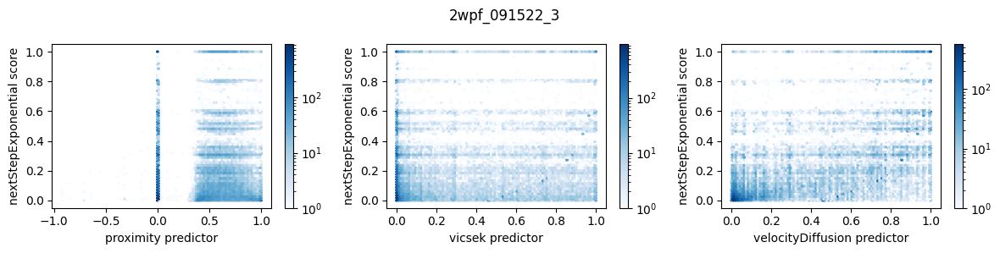

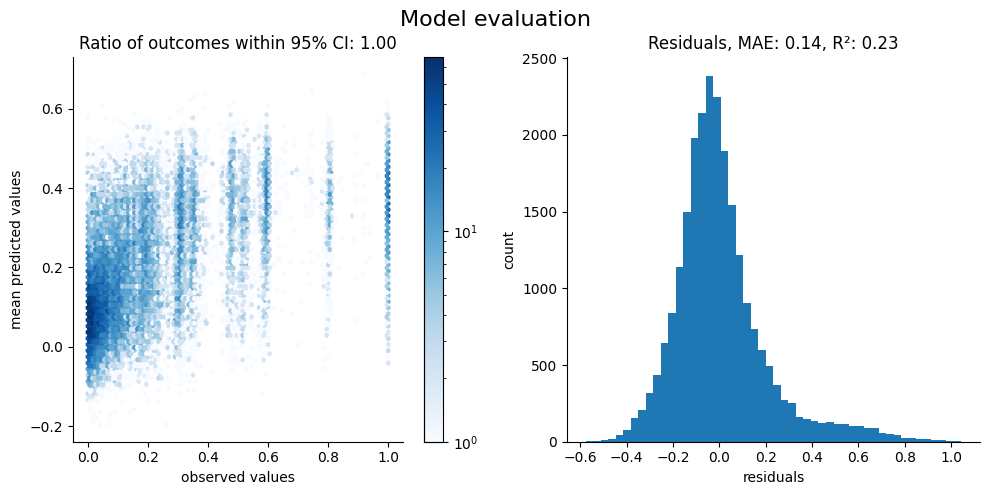

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-18 07:35:56,351 - Starting SVI inference with 1000 iterations.
2024-12-18 07:35:56,375 - Step 0, elbo loss: 79998.89725449965
2024-12-18 07:35:59,716 - Step 200, elbo loss: 62693.811369487106
2024-12-18 07:36:02,982 - Step 400, elbo loss: 61073.6343611031
2024-12-18 07:36:06,417 - Step 600, elbo loss: 60413.59375262239
2024-12-18 07:36:09,892 - Step 800, elbo loss: 60277.656137605525
2024-12-18 07:36:13,354 - SVI inference completed in 17.00 seconds.


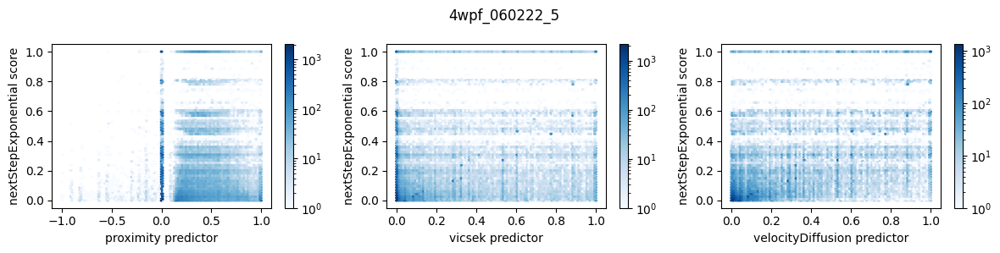

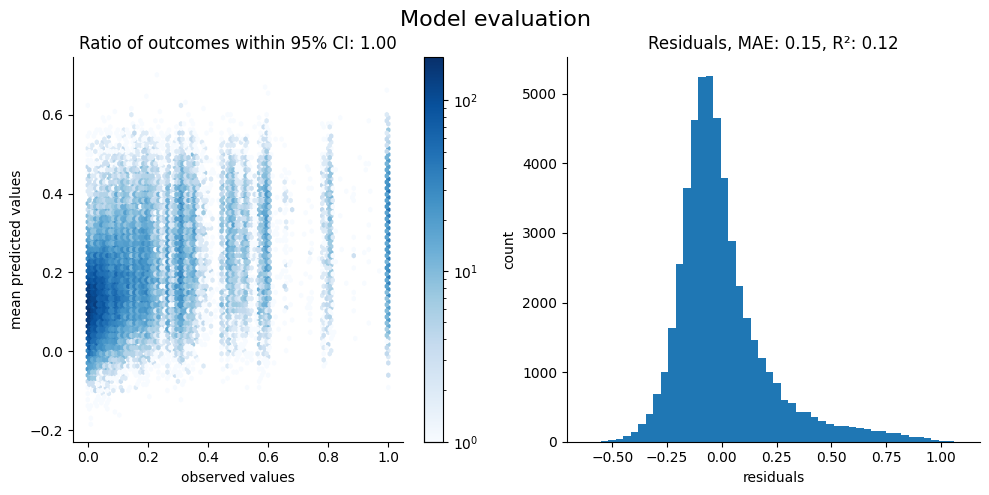

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-18 07:36:29,116 - Starting SVI inference with 1000 iterations.
2024-12-18 07:36:29,149 - Step 0, elbo loss: 170551.1920903896
2024-12-18 07:36:33,478 - Step 200, elbo loss: 121605.8398225916
2024-12-18 07:36:37,732 - Step 400, elbo loss: 117492.70358203133
2024-12-18 07:36:41,951 - Step 600, elbo loss: 117241.09031470788
2024-12-18 07:36:46,342 - Step 800, elbo loss: 115872.15889067983
2024-12-18 07:36:50,650 - SVI inference completed in 21.53 seconds.


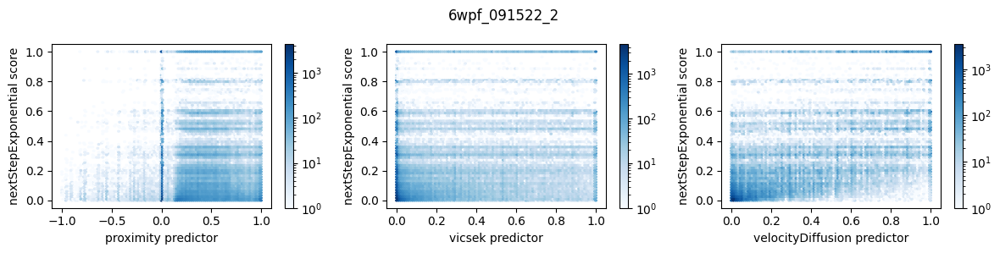

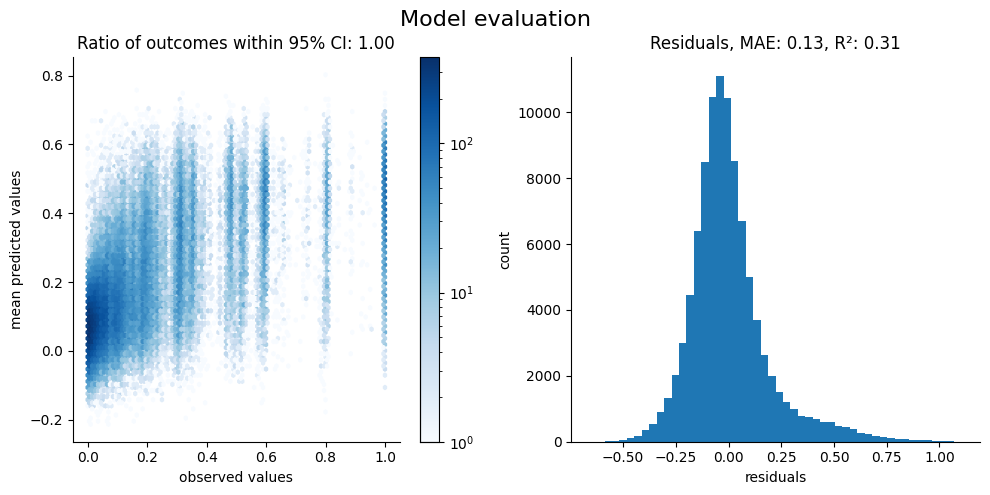

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-18 07:37:14,484 - Starting SVI inference with 1000 iterations.
2024-12-18 07:37:14,537 - Step 0, elbo loss: 302075.4596198589
2024-12-18 07:37:21,894 - Step 200, elbo loss: 246417.959549842
2024-12-18 07:37:28,923 - Step 400, elbo loss: 239948.64542949977
2024-12-18 07:37:36,097 - Step 600, elbo loss: 237430.82037148805
2024-12-18 07:37:43,271 - Step 800, elbo loss: 235906.5608428351
2024-12-18 07:37:50,299 - SVI inference completed in 35.81 seconds.


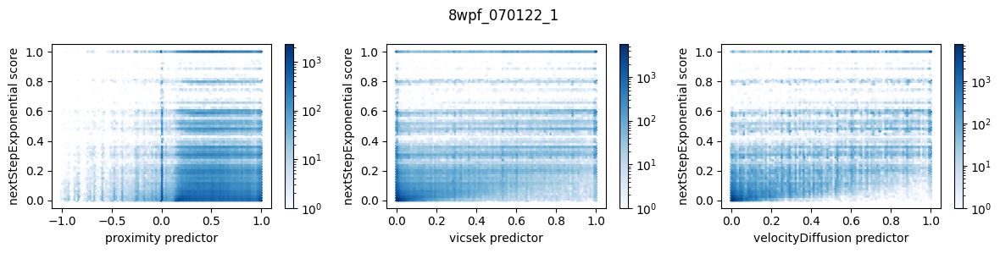

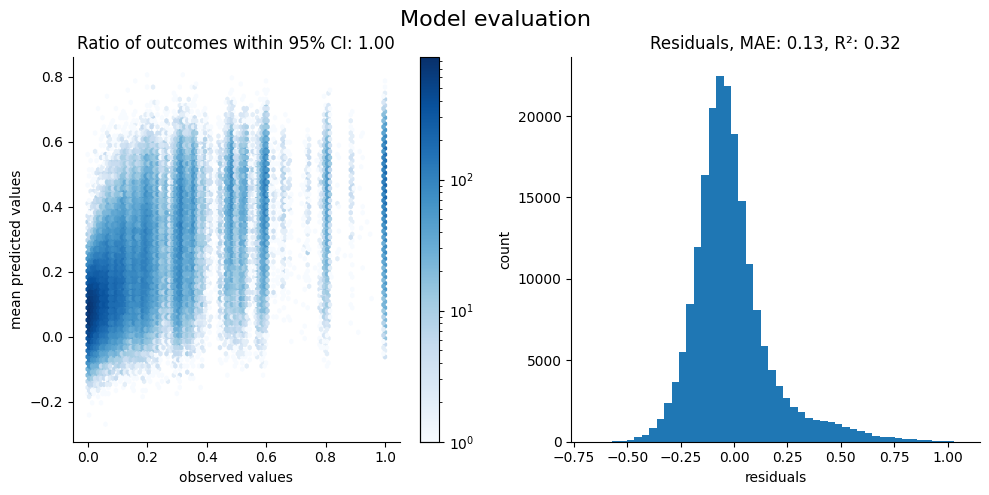

In [144]:
for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using raw predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_raw[exp] = samples

# Repeat for scaled scores

In [145]:
score_names = ["nextStepExponential_scaled"]
predictor_names = ["proximity_scaled", "vicsek_scaled", "velocityDiffusion_scaled"]

### Visualize the predictors and scores for each age

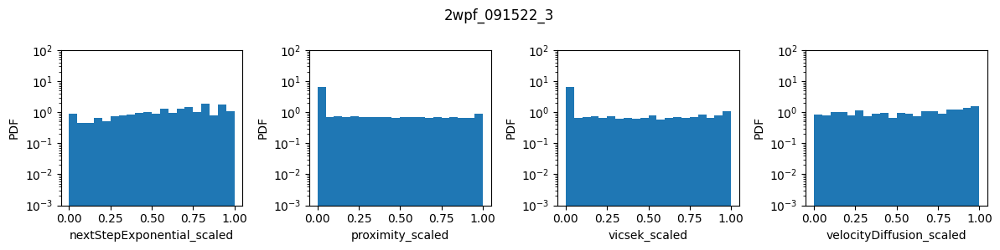

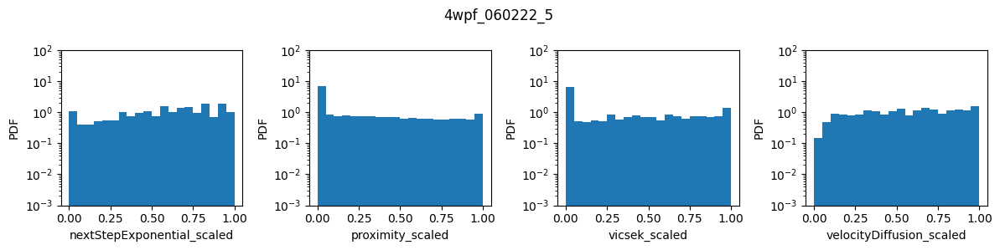

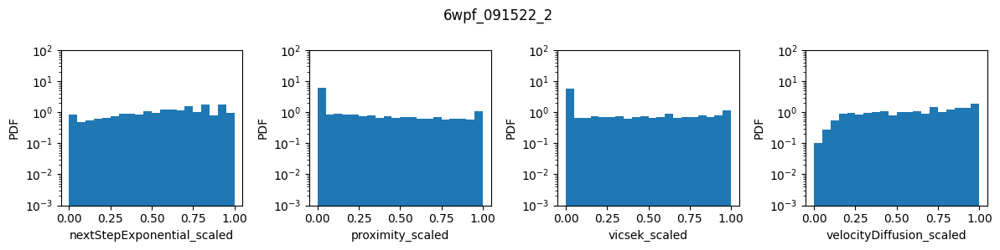

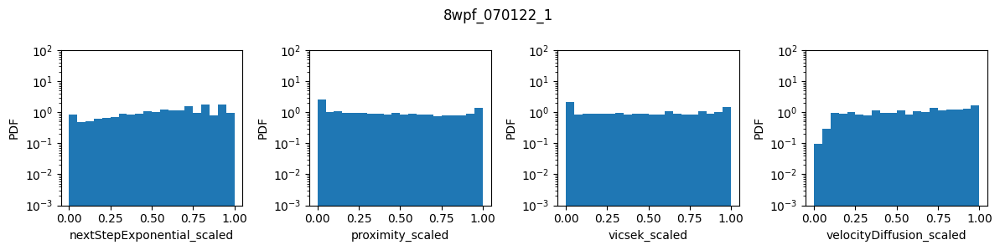

In [146]:
for exp in exp_names:
    plot_distributions(exp_wise_derivedDF[exp], score_names + predictor_names,title=exp)

### Perform inference and save coefficient samples for each age

In [147]:
coefficients_scaled = {}

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-18 07:38:19,527 - Starting SVI inference with 1000 iterations.
2024-12-18 07:38:19,552 - Step 0, elbo loss: 37821.310500162814
2024-12-18 07:38:22,605 - Step 200, elbo loss: 30878.131987472414
2024-12-18 07:38:25,647 - Step 400, elbo loss: 29760.512652518562
2024-12-18 07:38:28,582 - Step 600, elbo loss: 29479.797307810863
2024-12-18 07:38:31,721 - Step 800, elbo loss: 29324.686960392268
2024-12-18 07:38:34,756 - SVI inference completed in 15.23 seconds.


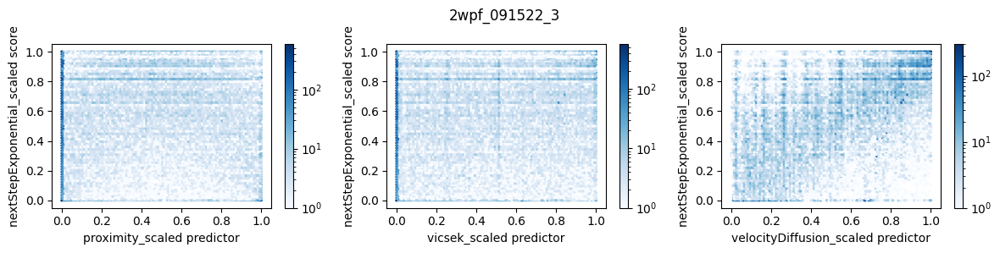

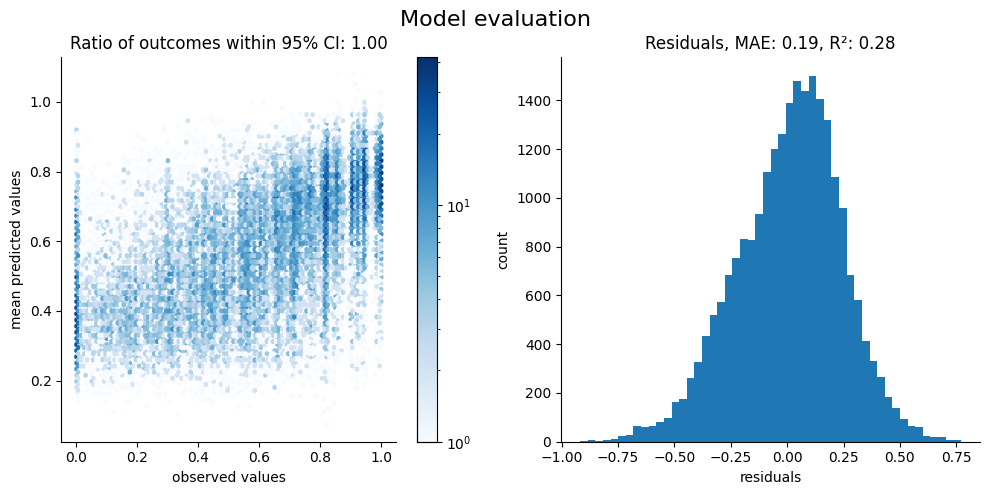

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-18 07:38:47,096 - Starting SVI inference with 1000 iterations.
2024-12-18 07:38:47,121 - Step 0, elbo loss: 80878.28744232448
2024-12-18 07:38:50,412 - Step 200, elbo loss: 65409.45617412256
2024-12-18 07:38:53,757 - Step 400, elbo loss: 63231.41040850561
2024-12-18 07:38:57,111 - Step 600, elbo loss: 62721.92003358355
2024-12-18 07:39:00,510 - Step 800, elbo loss: 62094.91005875688
2024-12-18 07:39:03,896 - SVI inference completed in 16.80 seconds.


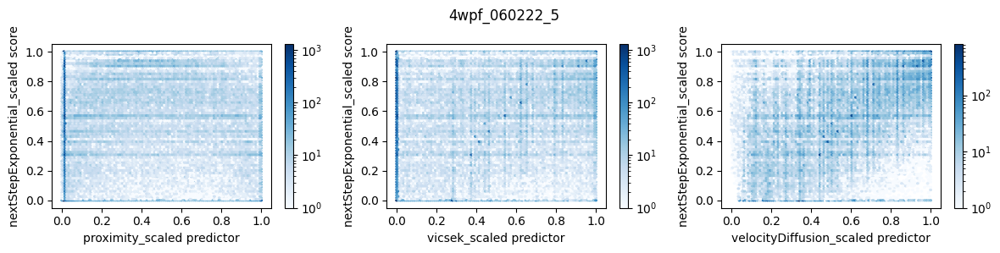

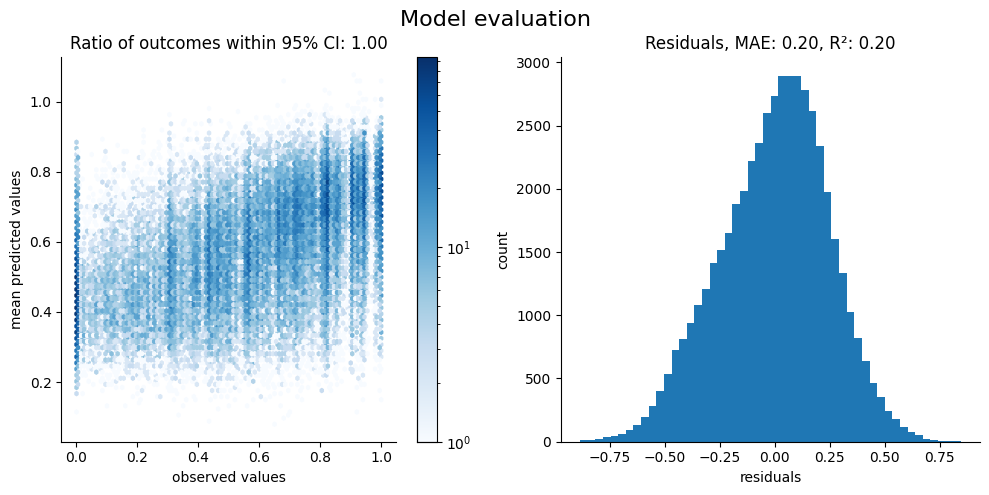

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-18 07:39:19,463 - Starting SVI inference with 1000 iterations.
2024-12-18 07:39:19,495 - Step 0, elbo loss: 153612.32712862096
2024-12-18 07:39:26,485 - Step 200, elbo loss: 125161.33221935251
2024-12-18 07:39:30,750 - Step 400, elbo loss: 120775.17441039711
2024-12-18 07:39:35,077 - Step 600, elbo loss: 119884.6548630406
2024-12-18 07:39:39,134 - Step 800, elbo loss: 119322.80640039561
2024-12-18 07:39:43,386 - SVI inference completed in 23.92 seconds.


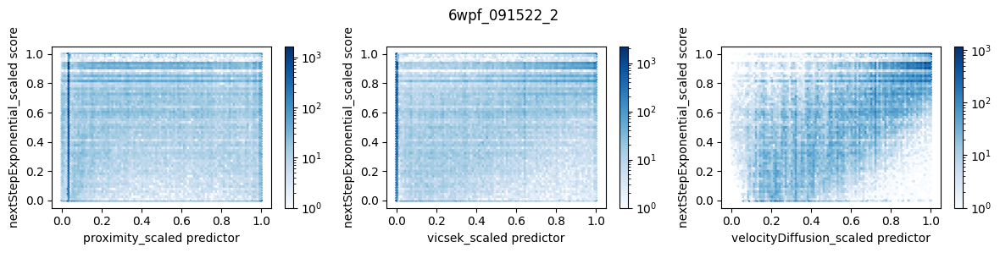

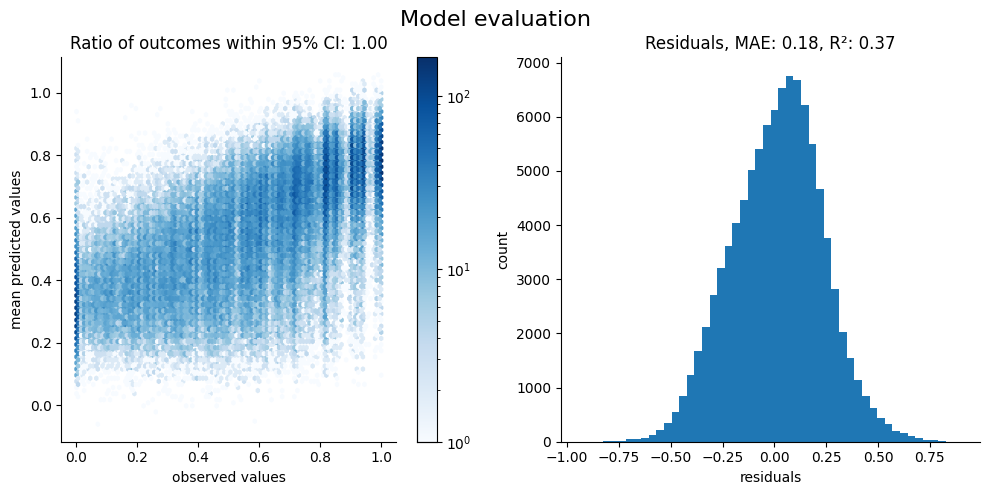

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-18 07:40:07,453 - Starting SVI inference with 1000 iterations.
2024-12-18 07:40:07,507 - Step 0, elbo loss: 311245.2340949544
2024-12-18 07:40:14,863 - Step 200, elbo loss: 255942.12154148892
2024-12-18 07:40:22,057 - Step 400, elbo loss: 248597.14717390624
2024-12-18 07:40:29,634 - Step 600, elbo loss: 242902.08712967168
2024-12-18 07:40:36,989 - Step 800, elbo loss: 242203.75691317805
2024-12-18 07:40:44,624 - SVI inference completed in 37.17 seconds.


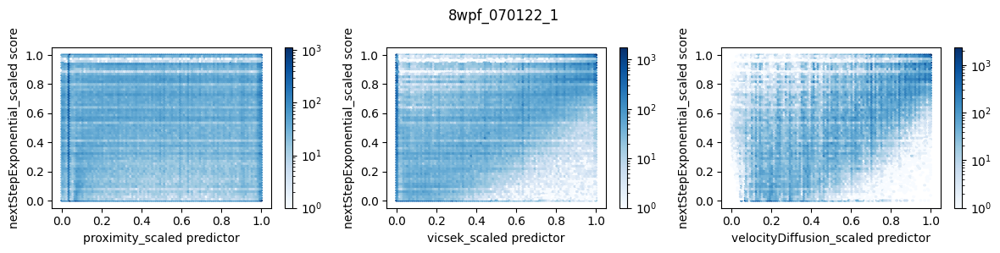

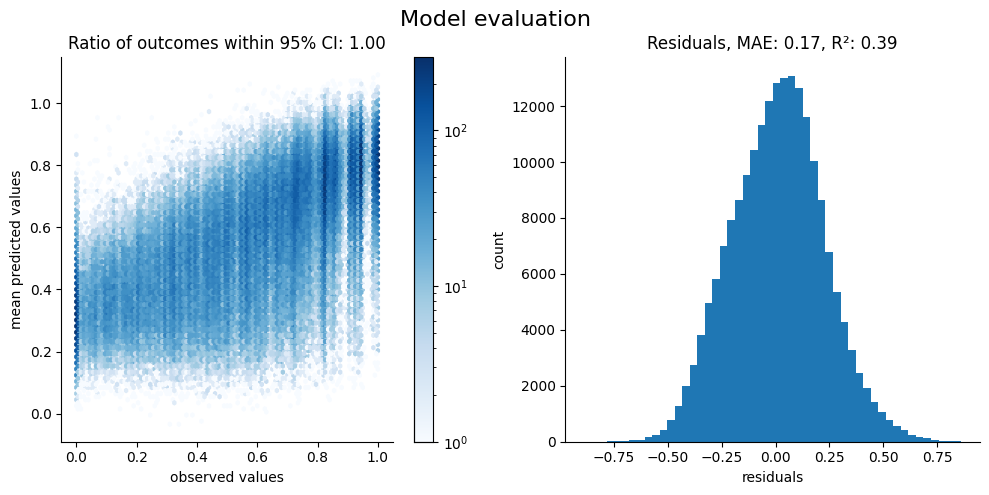

In [148]:
for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using scaled predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_scaled[exp] = samples

## Since big turns are rare in the data, it is possible that the contribution of `proximity` and `vicsek` are overshadowed by `velocityDiffusion`.
### Repeat above using only the first two predictors

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-18 07:41:05,860 - Starting SVI inference with 1000 iterations.
2024-12-18 07:41:05,882 - Step 0, elbo loss: 39306.68588586255
2024-12-18 07:41:08,670 - Step 200, elbo loss: 30376.96270043461
2024-12-18 07:41:11,537 - Step 400, elbo loss: 29737.6056408495
2024-12-18 07:41:14,242 - Step 600, elbo loss: 29534.655948382075
2024-12-18 07:41:16,962 - Step 800, elbo loss: 29296.23337486638
2024-12-18 07:41:19,546 - SVI inference completed in 13.69 seconds.


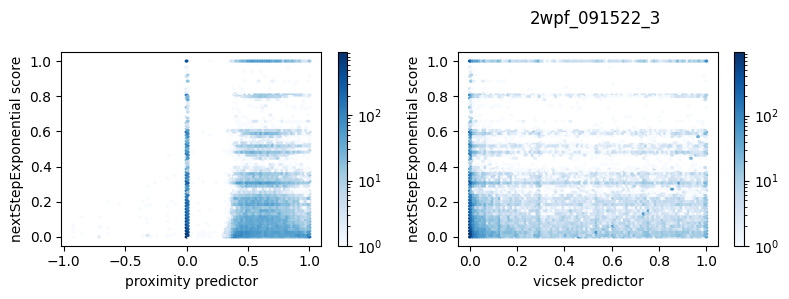

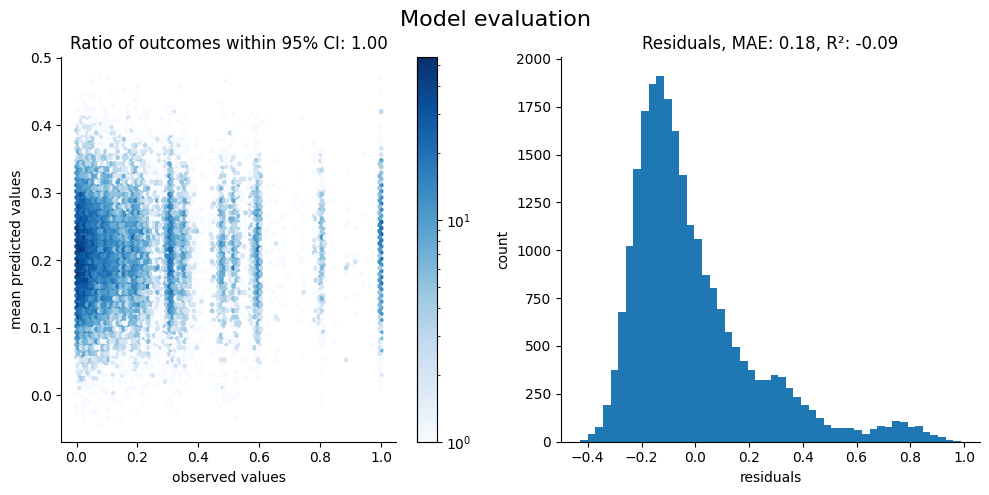

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-18 07:41:28,740 - Starting SVI inference with 1000 iterations.
2024-12-18 07:41:28,766 - Step 0, elbo loss: 70027.78385031603
2024-12-18 07:41:31,897 - Step 200, elbo loss: 63156.93751322319
2024-12-18 07:41:34,746 - Step 400, elbo loss: 61767.36580930261
2024-12-18 07:41:37,707 - Step 600, elbo loss: 61411.35459584038
2024-12-18 07:41:40,778 - Step 800, elbo loss: 61128.11320722137
2024-12-18 07:41:43,954 - SVI inference completed in 15.21 seconds.


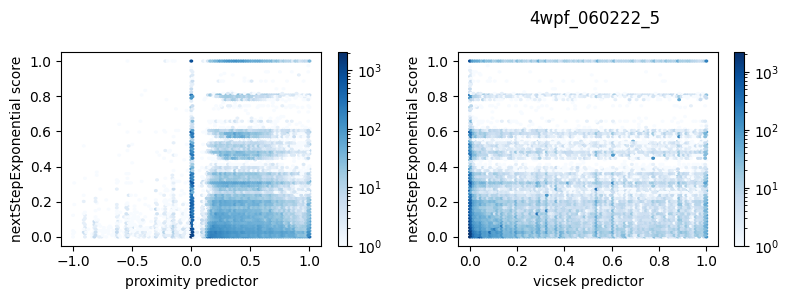

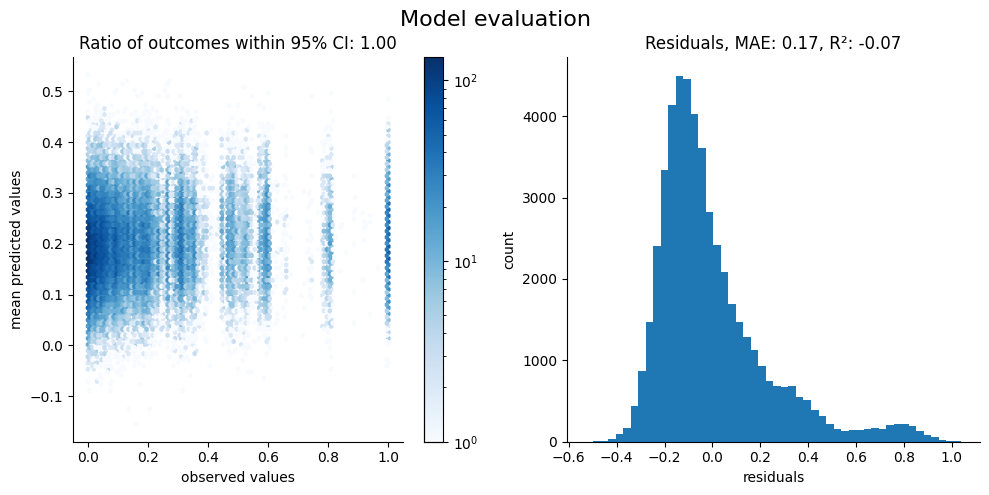

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-18 07:41:56,130 - Starting SVI inference with 1000 iterations.
2024-12-18 07:41:56,159 - Step 0, elbo loss: 151281.42153197317
2024-12-18 07:41:59,795 - Step 200, elbo loss: 123816.59204517225
2024-12-18 07:42:03,798 - Step 400, elbo loss: 120857.34288706491
2024-12-18 07:42:07,632 - Step 600, elbo loss: 119981.80874765653
2024-12-18 07:42:11,392 - Step 800, elbo loss: 119006.05572080197
2024-12-18 07:42:15,099 - SVI inference completed in 18.97 seconds.


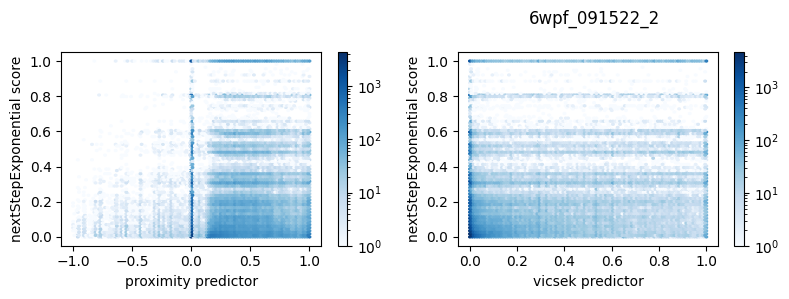

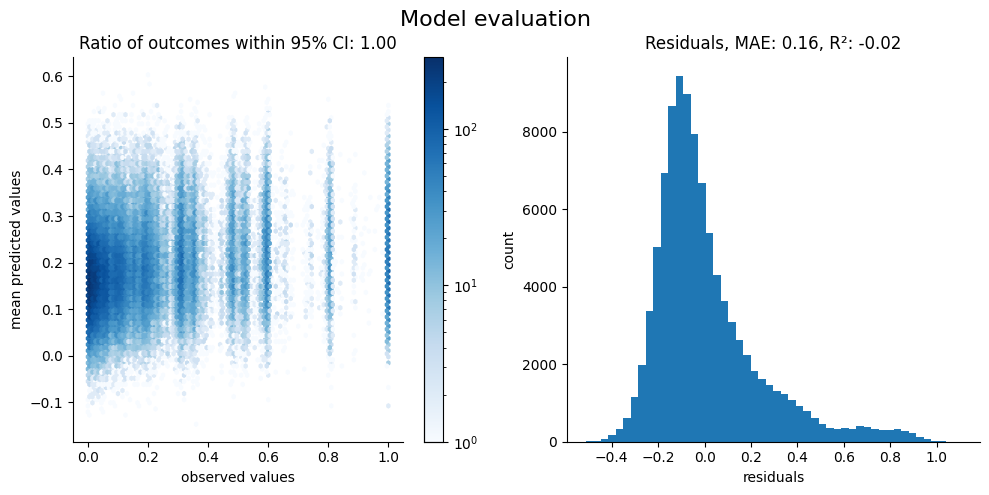

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-18 07:42:33,751 - Starting SVI inference with 1000 iterations.
2024-12-18 07:42:33,799 - Step 0, elbo loss: 312708.14138499484
2024-12-18 07:42:40,186 - Step 200, elbo loss: 250948.32598995478
2024-12-18 07:42:46,660 - Step 400, elbo loss: 241593.01243907324
2024-12-18 07:42:52,922 - Step 600, elbo loss: 239803.84053133512
2024-12-18 07:42:59,221 - Step 800, elbo loss: 239040.13213988356
2024-12-18 07:43:05,447 - SVI inference completed in 31.69 seconds.


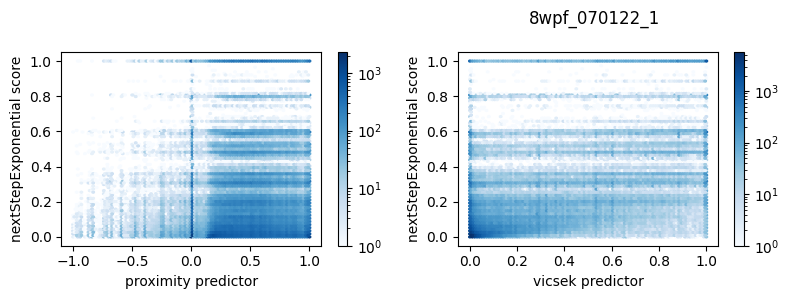

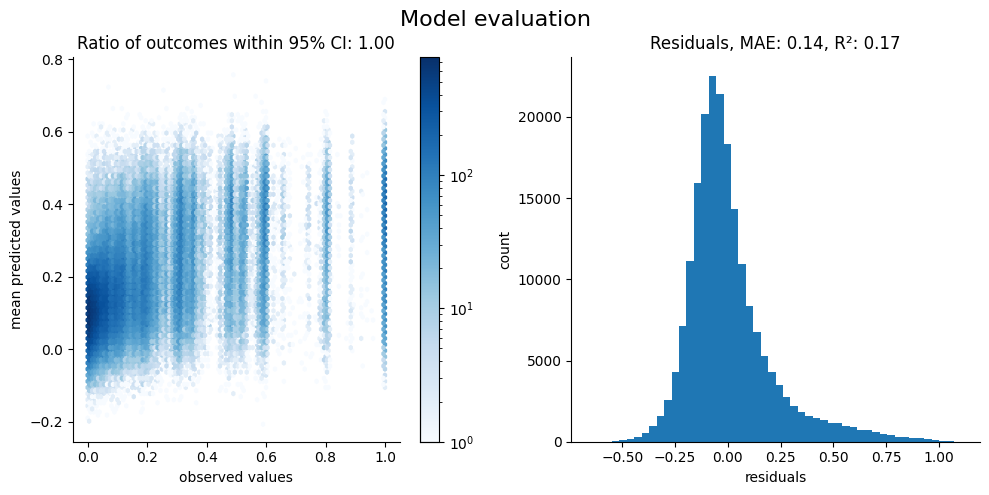

In [149]:
coefficients_raw_no_diffusion = {}
predictor_names = ["proximity", "vicsek"]
score_names = ["nextStepExponential"]

for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using raw predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_raw_no_diffusion[exp] = samples

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-18 07:43:22,972 - Starting SVI inference with 1000 iterations.
2024-12-18 07:43:22,993 - Step 0, elbo loss: 35035.887133573546
2024-12-18 07:43:25,664 - Step 200, elbo loss: 31601.558075511257
2024-12-18 07:43:28,378 - Step 400, elbo loss: 30895.268894813227
2024-12-18 07:43:31,041 - Step 600, elbo loss: 30677.41211321154
2024-12-18 07:43:33,672 - Step 800, elbo loss: 30574.695272292607
2024-12-18 07:43:36,396 - SVI inference completed in 13.42 seconds.


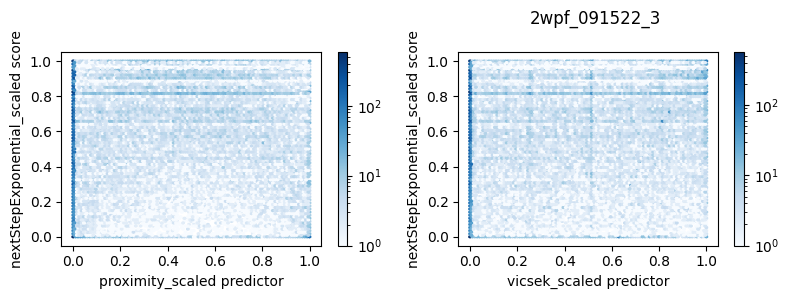

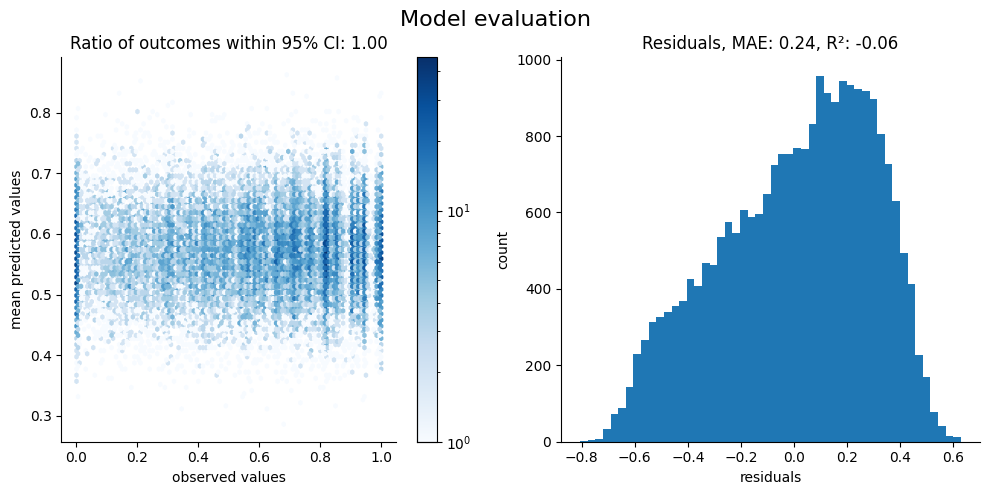

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-18 07:43:45,933 - Starting SVI inference with 1000 iterations.
2024-12-18 07:43:45,955 - Step 0, elbo loss: 74484.9380508544
2024-12-18 07:43:48,760 - Step 200, elbo loss: 66108.72337060455
2024-12-18 07:43:51,785 - Step 400, elbo loss: 64876.17285752752
2024-12-18 07:43:54,696 - Step 600, elbo loss: 64157.504766033504
2024-12-18 07:43:57,589 - Step 800, elbo loss: 63830.46377471687
2024-12-18 07:44:00,495 - SVI inference completed in 14.56 seconds.


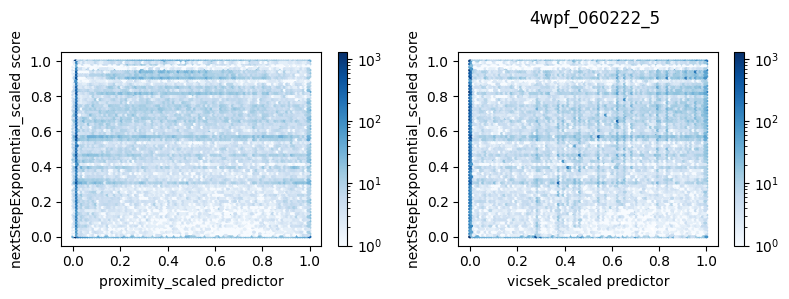

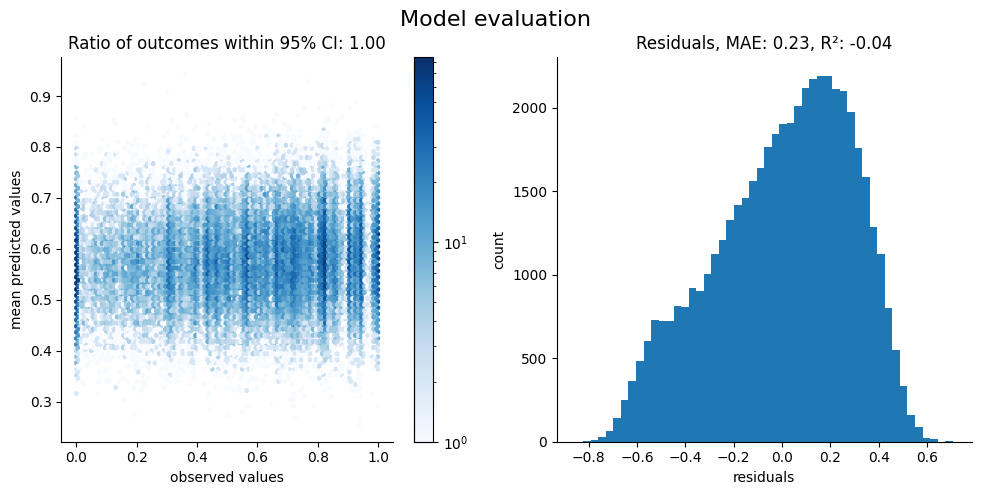

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-18 07:44:13,199 - Starting SVI inference with 1000 iterations.
2024-12-18 07:44:13,230 - Step 0, elbo loss: 143790.78561633354
2024-12-18 07:44:17,092 - Step 200, elbo loss: 128973.05818500218
2024-12-18 07:44:20,718 - Step 400, elbo loss: 125525.84445075897
2024-12-18 07:44:24,351 - Step 600, elbo loss: 124541.54389101177
2024-12-18 07:44:28,061 - Step 800, elbo loss: 124281.75648503119
2024-12-18 07:44:34,438 - SVI inference completed in 21.24 seconds.


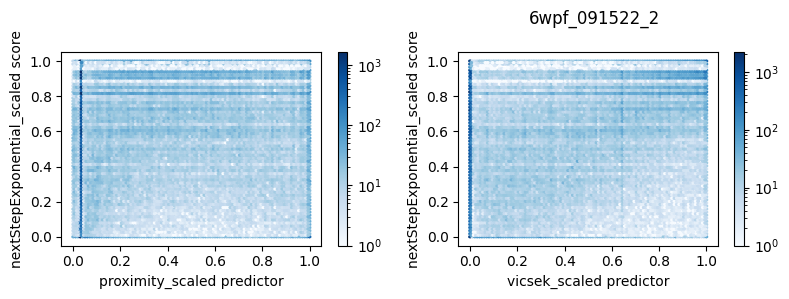

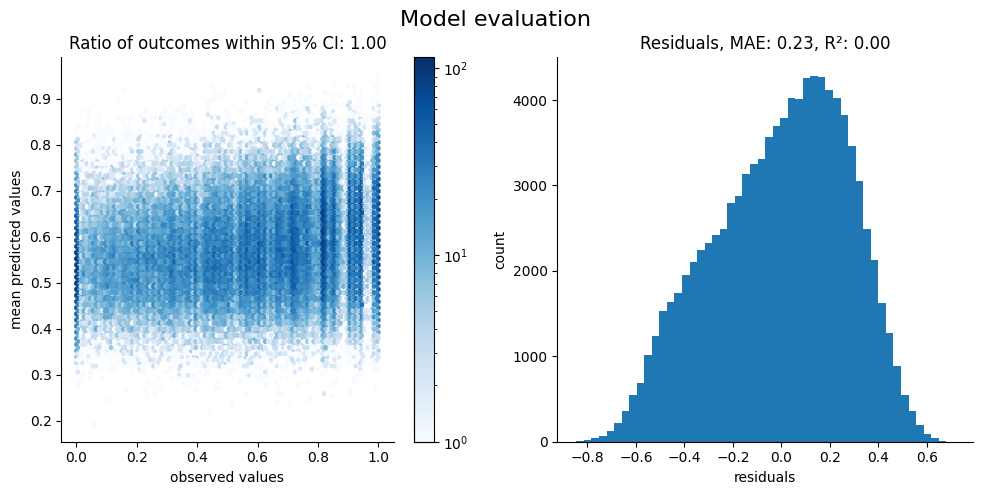

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-18 07:44:52,914 - Starting SVI inference with 1000 iterations.
2024-12-18 07:44:52,962 - Step 0, elbo loss: 312129.12145969336
2024-12-18 07:44:59,252 - Step 200, elbo loss: 259867.73209699453
2024-12-18 07:45:05,739 - Step 400, elbo loss: 250262.64099591074
2024-12-18 07:45:12,038 - Step 600, elbo loss: 248218.0574752725
2024-12-18 07:45:18,609 - Step 800, elbo loss: 246617.0543962994
2024-12-18 07:45:25,286 - SVI inference completed in 32.37 seconds.


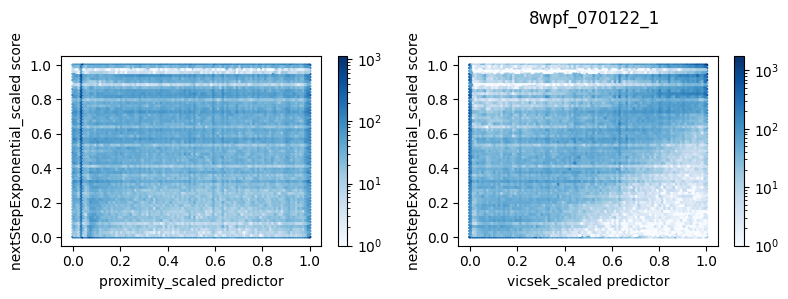

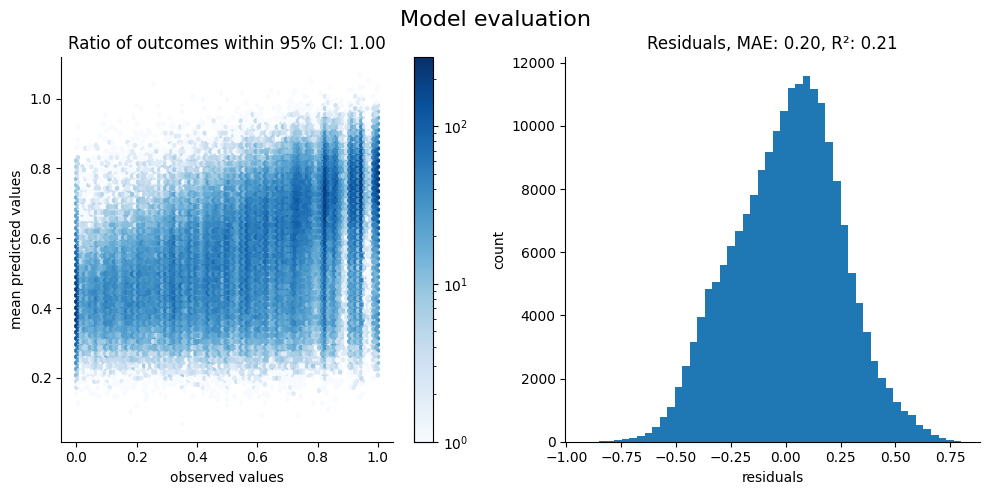

In [150]:
coefficients_scaled_no_diffusion = {}
predictor_names = ["proximity_scaled", "vicsek_scaled"]
score_names = ["nextStepExponential_scaled"]

for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using scaled predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_scaled_no_diffusion[exp] = samples

In [151]:
def plot_comparative_results(samples,title):
    fig, ax = plt.subplots(1,1, figsize=(5,5))
    ax.axhline(0,linestyle="--",color='k')
    ax.axvline(0,linestyle="--",color='k')

    for exp,sample in samples.items():
        try:
            p = sample["weight_proximity"]
            v = sample["weight_vicsek"]
        except KeyError:
            p = sample["weight_proximity_scaled"]
            v = sample["weight_vicsek_scaled"]

        ax.scatter(p,v,alpha=0.3,label=exp,s=5)

    ax.set_xlabel("proximity coefficient")
    ax.set_ylabel("vicsek coefficient")
    ax.set_xlim([-0.2,0.6])
    ax.set_ylim([-0.2,0.6])
    ax.legend()
    fig.suptitle(title)

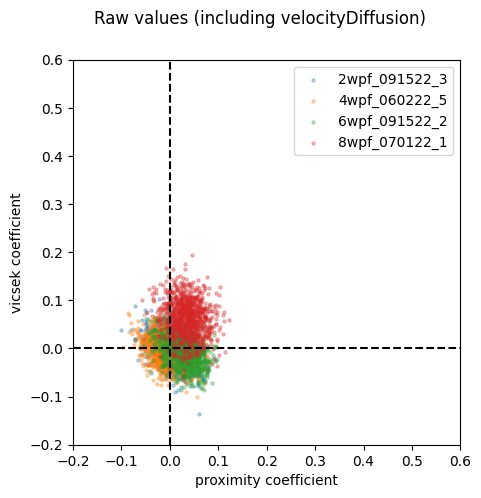

In [152]:
plot_comparative_results(coefficients_raw,"Raw values (including velocityDiffusion)")

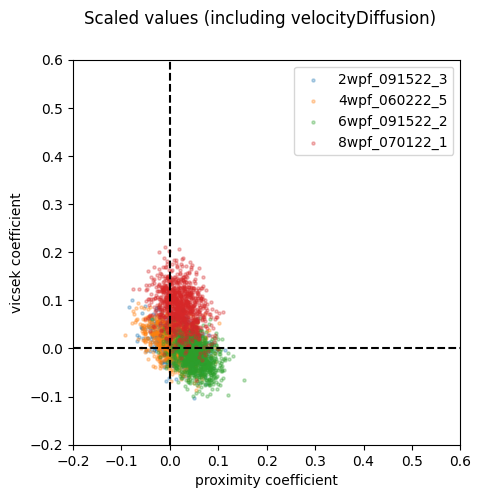

In [153]:
plot_comparative_results(coefficients_scaled,"Scaled values (including velocityDiffusion)")

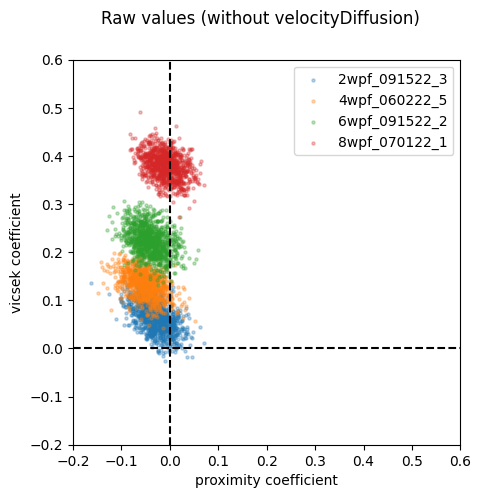

In [154]:
plot_comparative_results(coefficients_raw_no_diffusion,"Raw values (without velocityDiffusion)")

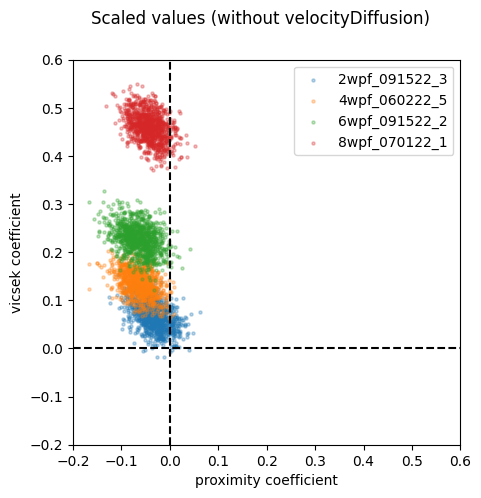

In [155]:
plot_comparative_results(coefficients_scaled_no_diffusion,"Scaled values (without velocityDiffusion)")